# Self-Driving Car Engineer Nanodegree

## Deep Learning

## Project: Build a Traffic Sign Recognition Classifier

In this notebook, a template is provided for you to implement your functionality in stages which is required to successfully complete this project. If additional code is required that cannot be included in the notebook, be sure that the Python code is successfully imported and included in your submission, if necessary. Sections that begin with **'Implementation'** in the header indicate where you should begin your implementation for your project. Note that some sections of implementation are optional, and will be marked with **'Optional'** in the header.

In addition to implementing code, there will be questions that you must answer which relate to the project and your implementation. Each section where you will answer a question is preceded by a **'Question'** header. Carefully read each question and provide thorough answers in the following text boxes that begin with **'Answer:'**. Your project submission will be evaluated based on your answers to each of the questions and the implementation you provide.

>**Note:** Code and Markdown cells can be executed using the **Shift + Enter** keyboard shortcut. In addition, Markdown cells can be edited by typically double-clicking the cell to enter edit mode.

---
## Step 0: Load The Data

In [1]:
# Load pickled data
import pickle

# TODO: Fill this in based on where you saved the training and testing data

training_file = 'traffic-signs-data/train.p'
testing_file = 'traffic-signs-data/test.p'

with open(training_file, mode='rb') as f:
    train = pickle.load(f)
with open(testing_file, mode='rb') as f:
    test = pickle.load(f)
    
X_train, y_train = train['features'], train['labels']
X_test, y_test = test['features'], test['labels']

print ("X_train_Count : ",len(X_train))
print("y_train_count : ",len(y_train))
print("X_test_count : ",len(X_test))
print("y_test_count : ",len(y_test))
print("Shape of image before normalization:",X_train[0].shape)

X_train_Count :  39209
y_train_count :  39209
X_test_count :  12630
y_test_count :  12630
Shape of image before normalization: (32, 32, 3)


In [2]:
from sklearn.model_selection import train_test_split

X_train_non_normalized, X_validation, y_train_non_normalized, y_validation = train_test_split(X_train, y_train, test_size=0.2, random_state=0)

assert(len(X_train_non_normalized) == len(y_train_non_normalized))
assert(len(X_validation) == len(y_validation))
assert(len(X_test) == len(y_test))

print("Test Train data generated")

Test Train data generated


In [3]:
import cv2
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
%matplotlib inline
matplotlib.rcParams['figure.figsize'] = (20.0, 10.0)

X_train = []
y_train = []
for i, (image, label) in enumerate(zip(X_train_non_normalized, y_train_non_normalized)):
    zeros = np.zeros((32,32,3))
    norm_image = cv2.normalize(image, zeros, alpha=0, beta=1, norm_type=cv2.NORM_MINMAX, dtype=cv2.CV_32F)
    X_train.append(norm_image)
    y_train.append(label)


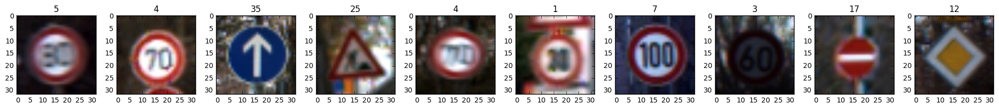

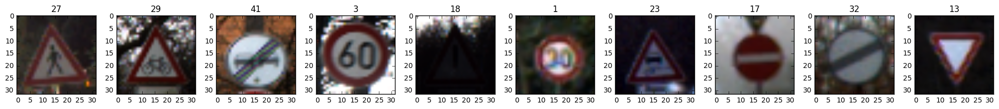

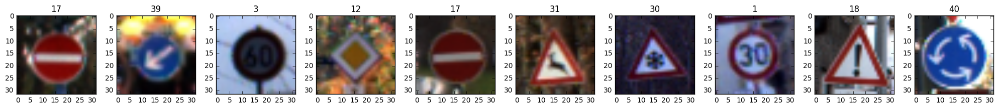

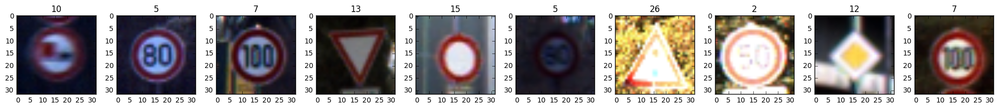

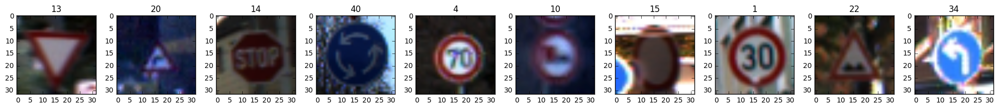

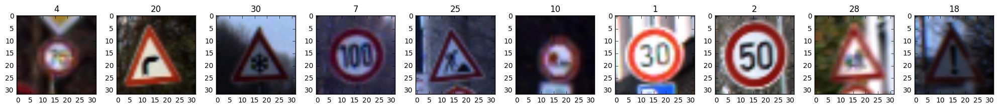

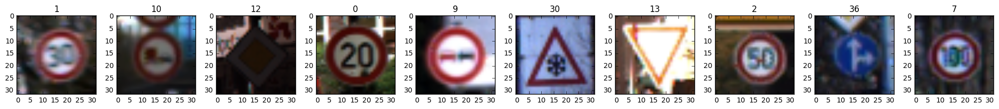

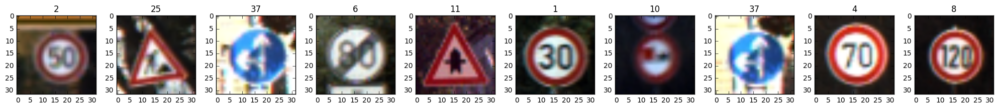

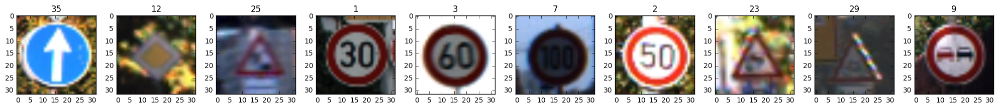

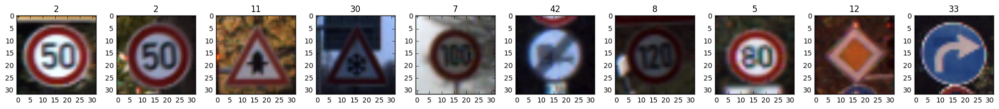

In [4]:
import random

mini_batch_size = 10
for start in range(0, 100, mini_batch_size): 
    fig, axes = plt.subplots(1,mini_batch_size)
    end = start+mini_batch_size
    for i, ((image, ax), label) in enumerate(zip(zip(X_train[start:end], axes), y_train[start:end])):
        ax.set_title(label)
        ax.imshow(image.squeeze())

    plt.tight_layout()
    plt.subplots_adjust(top=0.85)
    plt.show()

---

## Step 1: Dataset Summary & Exploration

The pickled data is a dictionary with 4 key/value pairs:

- `'features'` is a 4D array containing raw pixel data of the traffic sign images, (num examples, width, height, channels).
- `'labels'` is a 2D array containing the label/class id of the traffic sign. The file `signnames.csv` contains id -> name mappings for each id.
- `'sizes'` is a list containing tuples, (width, height) representing the the original width and height the image.
- `'coords'` is a list containing tuples, (x1, y1, x2, y2) representing coordinates of a bounding box around the sign in the image. **THESE COORDINATES ASSUME THE ORIGINAL IMAGE. THE PICKLED DATA CONTAINS RESIZED VERSIONS (32 by 32) OF THESE IMAGES**

Complete the basic data summary below.

In [5]:
### Replace each question mark with the appropriate value.

# TODO: Number of training examples
n_train = len(X_train)

# TODO: Number of testing examples.
n_test = len(X_test)

# TODO: What's the shape of an traffic sign image?
image_shape = X_train[0].shape

# TODO: How many unique classes/labels there are in the dataset.
n_classes = 43

print("Number of training examples =", n_train)
print("Number of testing examples =", n_test)
print("Image data shape =", image_shape)
print("Number of classes =", n_classes)

Number of training examples = 31367
Number of testing examples = 12630
Image data shape = (32, 32, 3)
Number of classes = 43


Visualize the German Traffic Signs Dataset using the pickled file(s). This is open ended, suggestions include: plotting traffic sign images, plotting the count of each sign, etc.

The [Matplotlib](http://matplotlib.org/) [examples](http://matplotlib.org/examples/index.html) and [gallery](http://matplotlib.org/gallery.html) pages are a great resource for doing visualizations in Python.

**NOTE:** It's recommended you start with something simple first. If you wish to do more, come back to it after you've completed the rest of the sections.

15
index : 28050


<function matplotlib.pyplot.subplot>

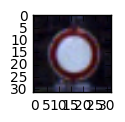

In [6]:
### Data exploration visualization goes here.
### Feel free to use as many code cells as needed.
# Visualizations will be shown in the notebook.
%matplotlib inline
index = random.randint(0, len(X_train))
image = X_train[index].squeeze()

plt.figure(figsize=(1,1))
plt.imshow(image)
print(y_train[index])
print("index :",index)

plt.subplot


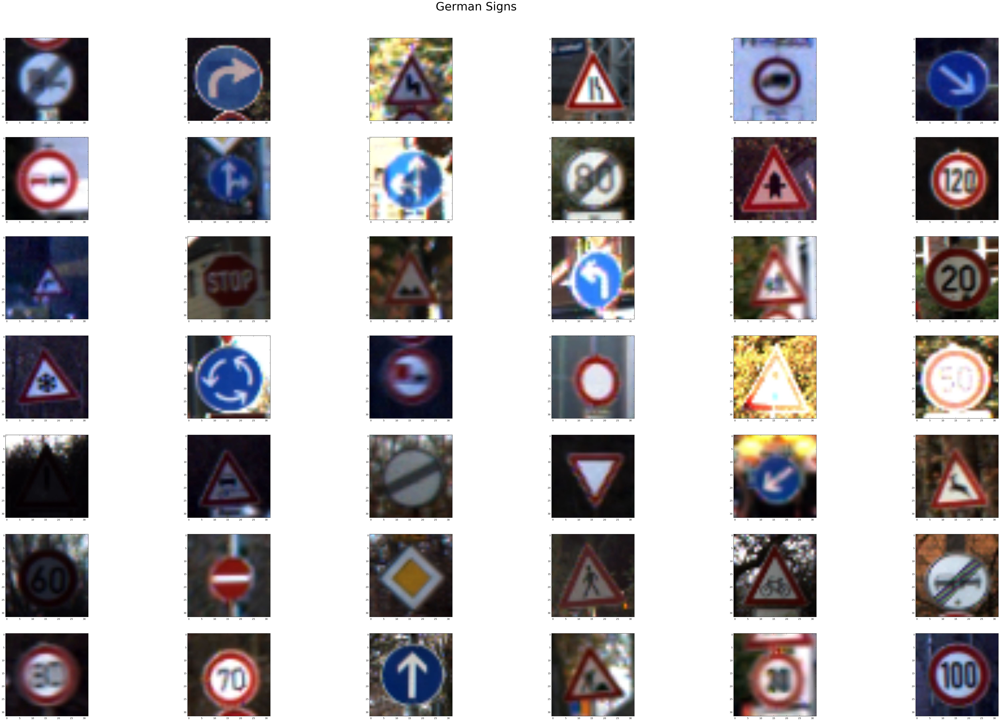

In [7]:
"""
German Signs.
"""
matplotlib.rcParams['figure.figsize'] = (20.0, 10.0)
from matplotlib.pyplot import figure, show
from matplotlib.font_manager import FontProperties

# Example data
sign_id = np.arange(0,43)
sign_count = np.zeros(43)

Nr = 7
Nc = 6

fig = figure()
figtitle = 'German Signs'
t = fig.text(1.5, 4.5, figtitle,
             verticalalignment ='top',
             fontproperties=FontProperties(size=50))

w = 0.5
h = 0.5       
image_list=[]
ax = []
for i in range(len(y_train)):
    sign_count[y_train[i]] = sign_count[y_train[i]]+1
    if (sign_count[y_train[i]]==1.0):
        image = X_train[i].squeeze()
    if (sign_count[y_train[i]]==1.0):
        image = X_train[i].squeeze()
        image_list.append(image)

k=0    
for i in range(Nr):
    for j in range(Nc):
        pos = [0.075 + j*1.1*w, 0.18 + i*1.2*h, w, h]
        a = fig.add_axes(pos)
        a.imshow(image_list[k])
        k +=1
        ax.append(a)    


    

<Container object of 43 artists>

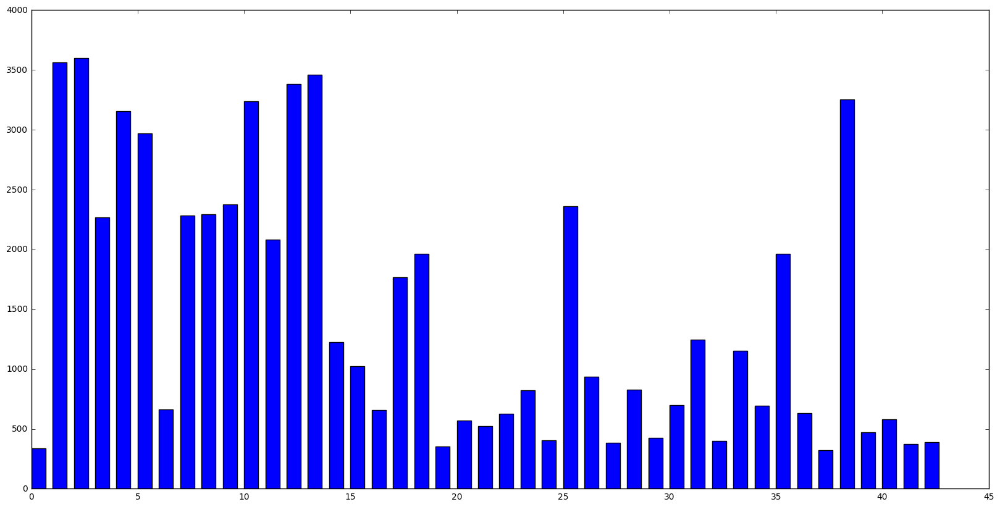

In [8]:
"""
Bar Plot of the count
"""
for i in range(len(y_train)):
    sign_count[y_train[i]] = sign_count[y_train[i]]+1

width = 1/1.5
plt.bar(sign_id, sign_count, width, color="blue")



----

## Step 2: Design and Test a Model Architecture

Design and implement a deep learning model that learns to recognize traffic signs. Train and test your model on the [German Traffic Sign Dataset](http://benchmark.ini.rub.de/?section=gtsrb&subsection=dataset).

There are various aspects to consider when thinking about this problem:

- Neural network architecture
- Play around preprocessing techniques (normalization, rgb to grayscale, etc)
- Number of examples per label (some have more than others).
- Generate fake data.

Here is an example of a [published baseline model on this problem](http://yann.lecun.com/exdb/publis/pdf/sermanet-ijcnn-11.pdf). It's not required to be familiar with the approach used in the paper but, it's good practice to try to read papers like these.

**NOTE:** The LeNet-5 implementation shown in the [classroom](https://classroom.udacity.com/nanodegrees/nd013/parts/fbf77062-5703-404e-b60c-95b78b2f3f9e/modules/6df7ae49-c61c-4bb2-a23e-6527e69209ec/lessons/601ae704-1035-4287-8b11-e2c2716217ad/concepts/d4aca031-508f-4e0b-b493-e7b706120f81) at the end of the CNN lesson is a solid starting point. You'll have to change the number of classes and possibly the preprocessing, but aside from that it's plug and play!

### Implementation

Use the code cell (or multiple code cells, if necessary) to implement the first step of your project. Once you have completed your implementation and are satisfied with the results, be sure to thoroughly answer the questions that follow.

In [9]:
### Preprocess the data here.
### Feel free to use as many code cells as needed.


In [10]:
from sklearn.utils import shuffle

X_train, y_train = shuffle(X_train, y_train)
print("X_train after Shuffle: ",len(X_train))
print("y_train after shuffle: ",len(y_train))



X_train after Shuffle:  31367
y_train after shuffle:  31367


In [11]:
import tensorflow as tf

EPOCHS = 50
BATCH_SIZE = 128

In [12]:
from tensorflow.contrib.layers import flatten

def LeNet(x):    
    # Arguments used for tf.truncated_normal, randomly defines variables for the weights and biases for each layer
    mu = 0
    sigma = 0.1
    
    # TODO: Layer 1: Convolutional. Input = 32x32x1. Output = 28x28x6.
    layer1_w = tf.Variable(tf.truncated_normal(shape = (5,5,3,6),mean = mu,stddev=sigma))
    layer1_b = tf.Variable(tf.zeros(6))
    conv1 = tf.nn.conv2d(x,layer1_w, strides = [1,1,1,1], padding = 'VALID') +layer1_b
    
    # TODO: Activation.
    conv1 =  tf.nn.relu(conv1)
    
    # TODO: Pooling. Input = 28x28x6. Output = 14x14x6.
    conv1 = tf.nn.max_pool(conv1,ksize=[1,2,2,1],strides= [1,2,2,1],padding = 'VALID')
    
    # TODO: Layer 2: Convolutional. Output = 10x10x16.
    layer2_w = tf.Variable(tf.truncated_normal(shape = (5,5,6,16),mean = mu,stddev=sigma))
    layer2_b = tf.Variable(tf.zeros(16))
    conv2 = tf.nn.conv2d(conv1,layer2_w, strides = [1,1,1,1], padding = 'VALID') +layer2_b
    
    # TODO: Activation.
    conv2 = tf.nn.relu(conv2)
    
    # TODO: Pooling. Input = 10x10x16. Output = 5x5x16.
    conv2 = tf.nn.max_pool(conv2,ksize=[1,2,2,1], strides = [1,2,2,1],padding = 'VALID')
    
    # TODO: Flatten. Input = 5x5x16. Output = 400.
    flatten_out = flatten(conv2)
    
    # TODO: Layer 3: Fully Connected. Input = 400. Output = 120.
    fc_w = tf.Variable(tf.truncated_normal(shape=(400,120), mean =mu, stddev = sigma ))
    fc_b = tf.Variable(tf.zeros(120))
    fc_out = tf.add(tf.matmul(flatten_out,fc_w),fc_b)
    # TODO: Activation.
    fc_act = tf.nn.relu(fc_out)

    # TODO: Layer 4: Fully Connected. Input = 120. Output = 84.
    fc2_w = tf.Variable(tf.truncated_normal(shape=(120,84),mean = mu, stddev = sigma))
    fc2_b = tf.Variable(tf.zeros(84))
    fc2_out = tf.add(tf.matmul(fc_act,fc2_w),fc2_b)
    # TODO: Activation.
    fc2_act = tf.nn.relu(fc2_out)

    # TODO: Layer 5: Fully Connected. Input = 84. Output = 10.
    fc3_w = tf.Variable(tf.truncated_normal(shape=(84,43),mean = mu, stddev = sigma))
    fc3_b = tf.Variable(tf.zeros(43))
    fc3_out = tf.add(tf.matmul(fc2_act,fc3_w),fc3_b)
    logits = fc3_out
    return logits

In [13]:
x = tf.placeholder(tf.float32, (None, 32, 32, 3))
y = tf.placeholder(tf.int32, (None))
one_hot_y = tf.one_hot(y, 43)

In [14]:
rate = 0.001

logits = LeNet(x)
cross_entropy = tf.nn.softmax_cross_entropy_with_logits(logits, one_hot_y)
loss_operation = tf.reduce_mean(cross_entropy)
optimizer = tf.train.AdamOptimizer(learning_rate = rate)
training_operation = optimizer.minimize(loss_operation)

In [15]:
correct_prediction = tf.equal(tf.argmax(logits, 1), tf.argmax(one_hot_y, 1))
accuracy_operation = tf.reduce_mean(tf.cast(correct_prediction, tf.float32))
saver = tf.train.Saver()

def evaluate(X_data, y_data):
    num_examples = len(X_data)
    total_accuracy = 0
    sess = tf.get_default_session()
    for offset in range(0, num_examples, BATCH_SIZE):
        batch_x, batch_y = X_data[offset:offset+BATCH_SIZE], y_data[offset:offset+BATCH_SIZE]
        accuracy = sess.run(accuracy_operation, feed_dict={x: batch_x, y: batch_y})
        total_accuracy += (accuracy * len(batch_x))
    return total_accuracy / num_examples

In [16]:
with tf.Session() as sess:
    #sess.run(tf.global_variables_initializer())
    sess.run(tf.initialize_all_variables())
    num_examples = len(X_train)
    
    print("Training...")
    print()
    for i in range(EPOCHS):
        X_train, y_train = shuffle(X_train, y_train)
        for offset in range(0, num_examples, BATCH_SIZE):
            end = offset + BATCH_SIZE
            batch_x, batch_y = X_train[offset:end], y_train[offset:end]
            sess.run(training_operation, feed_dict={x: batch_x, y: batch_y})
            
        validation_accuracy = evaluate(X_validation, y_validation)
        print("EPOCH {} ...".format(i+1))
        print("Validation Accuracy = {:.3f}".format(validation_accuracy))
        print()
        
    saver.save(sess, 'lenet')
    print("Model saved")

Instructions for updating:
Use `tf.global_variables_initializer` instead.
Training...

EPOCH 1 ...
Validation Accuracy = 0.750

EPOCH 2 ...
Validation Accuracy = 0.881

EPOCH 3 ...
Validation Accuracy = 0.923

EPOCH 4 ...
Validation Accuracy = 0.933

EPOCH 5 ...
Validation Accuracy = 0.945

EPOCH 6 ...
Validation Accuracy = 0.959

EPOCH 7 ...
Validation Accuracy = 0.962

EPOCH 8 ...
Validation Accuracy = 0.963

EPOCH 9 ...
Validation Accuracy = 0.962

EPOCH 10 ...
Validation Accuracy = 0.960

EPOCH 11 ...
Validation Accuracy = 0.968

EPOCH 12 ...
Validation Accuracy = 0.965

EPOCH 13 ...
Validation Accuracy = 0.969

EPOCH 14 ...
Validation Accuracy = 0.958

EPOCH 15 ...
Validation Accuracy = 0.973

EPOCH 16 ...
Validation Accuracy = 0.970

EPOCH 17 ...
Validation Accuracy = 0.961

EPOCH 18 ...
Validation Accuracy = 0.971

EPOCH 19 ...
Validation Accuracy = 0.972

EPOCH 20 ...
Validation Accuracy = 0.968

EPOCH 21 ...
Validation Accuracy = 0.967

EPOCH 22 ...
Validation Accuracy = 0.967

In [17]:
"""
Evaluation model
"""
with tf.Session() as sess:
    saver.restore(sess, tf.train.latest_checkpoint('.'))

    test_accuracy = evaluate(X_test, y_test)
    print("Test Accuracy = {:.3f}".format(test_accuracy))

Test Accuracy = 0.924


### Question 1 

_Describe how you preprocessed the data. Why did you choose that technique?_

**Answer:**

### Generate data additional data (OPTIONAL!)
### and split the data into training/validation/testing sets here.
### Feel free to use as many code cells as needed.
I have used the normalize frunction form the CV2 library. This was helpful to remove the unnecessary glares and contrast in the photographs and normalize the pixel values for better training of the model.
I have printed all the german signs, count of each sign in bar plot.
Split of the data into training and validation was done using train_test_split() and test sets as provided

### Question 2

_Describe how you set up the training, validation and testing data for your model. **Optional**: If you generated additional data, how did you generate the data? Why did you generate the data? What are the differences in the new dataset (with generated data) from the original dataset?_

**Answer:**

### Define your architecture here.
### Feel free to use as many code cells as needed.
I have used the same architecture of LeNet which we used in out previous lab. It works great along with the normalization and with increase in epocs. I think with controlling in the contrast corrections , use of droupout techiniques, augumaentation of the data and preprocessing test data too, will increase the accuracy. 

### Question 3

_What does your final architecture look like? (Type of model, layers, sizes, connectivity, etc.)  For reference on how to build a deep neural network using TensorFlow, see [Deep Neural Network in TensorFlow
](https://classroom.udacity.com/nanodegrees/nd013/parts/fbf77062-5703-404e-b60c-95b78b2f3f9e/modules/6df7ae49-c61c-4bb2-a23e-6527e69209ec/lessons/b516a270-8600-4f93-a0a3-20dfeabe5da6/concepts/83a3a2a2-a9bd-4b7b-95b0-eb924ab14432) from the classroom._


**Answer:**

### Train your model here.
### Feel free to use as many code cells as needed.
EPOCHS = 50
BATCH_SIZE = 128

Layer 1: Convolutional. Input = 32x32x1. Output = 28x28x6
 Activation.
 Pooling. Input = 28x28x6. Output = 14x14x6.
Layer 2: Convolutional. Output = 10x10x16
 Activation.
 Pooling. Input = 10x10x16. Output = 5x5x16.
 Flatten. Input = 5x5x16. Output = 400
Layer 3: Fully Connected. Input = 400. Output = 120.
 Activation.
Layer 4: Fully Connected. Input = 120. Output = 84.
 Activation.
Layer 5: Fully Connected. Input = 84. Output = 10.

### Question 4

_How did you train your model? (Type of optimizer, batch size, epochs, hyperparameters, etc.)_


**Answer:**
EPOCHS = 50
BATCH_SIZE = 128
Used the adamOptimizer and minimized the loss using optimizer.minimize as shown below
tf.train.AdamOptimizer(learning_rate = rate)
optimizer.minimize(loss_operation)

### Question 5


_What approach did you take in coming up with a solution to this problem? It may have been a process of trial and error, in which case, outline the steps you took to get to the final solution and why you chose those steps. Perhaps your solution involved an already well known implementation or architecture. In this case, discuss why you think this is suitable for the current problem._

**Answer:**
I decided Architecture to use the same as in LeNet lab as it had a good multilayered architecture. The Accuracy percentage was very low with the data used as it is. So decided to normalize the data as suggested in the video lectures. Also with trail and error i had to increase the Epoch. Since my AWS is still not active and was in a hurry to finish the work i managed to used tensorflow CPU in my worstation laptop. so i had to use epoch value not to high and not too low. with trail and error i got this result for epoch =50. i can further imporve by using the higher epoch value and by using additional preprocessing techniques. Also not to foget dropout technique. 

---

## Step 3: Test a Model on New Images

Take several pictures of traffic signs that you find on the web or around you (at least five), and run them through your classifier on your computer to produce example results. The classifier might not recognize some local signs but it could prove interesting nonetheless.

You may find `signnames.csv` useful as it contains mappings from the class id (integer) to the actual sign name.

### Implementation

Use the code cell (or multiple code cells, if necessary) to implement the first step of your project. Once you have completed your implementation and are satisfied with the results, be sure to thoroughly answer the questions that follow.

### Question 6

_Choose five candidate images of traffic signs and provide them in the report. Are there any particular qualities of the image(s) that might make classification difficult? It could be helpful to plot the images in the notebook._

Classification becomes difficult if the piture is captured in low light confitions or it is too blut or when the board becomes shiny when sun rays fall on it.

18


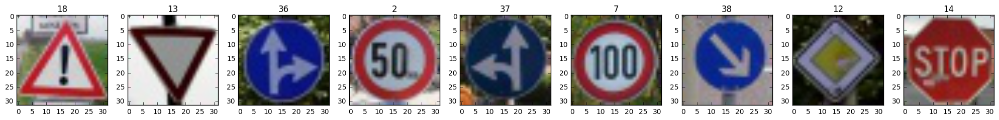

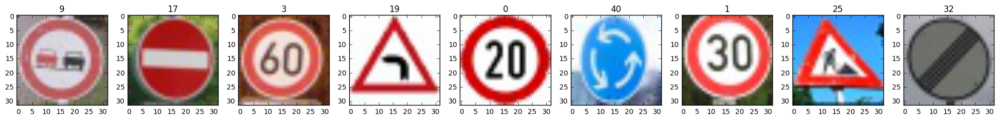

In [18]:
### Load the images and plot them here.
### Feel free to use as many code cells as needed.
import os

#images.clear()
images = []
path = './NewImages'
list_of_Images = os.listdir(path)
data_labels = [i.partition("-")[0] for i in list_of_Images]
for i in range (len(list_of_Images)):
    images.append(cv2.imread(path+'/'+list_of_Images[i],3))
    
for i in range(len(images)):
    b,g,r = cv2.split(images[i]) 
    images[i] = cv2.merge([r,g,b])
    
batch_size = 9  
print(len(images))
for start in range (0, len(images), batch_size):
    end = start + batch_size
    end = end if end < len(images) else len(images)
    batch_size = end-start
    fig,axes = plt.subplots(1, batch_size)
    end = start+batch_size
    for i, ((image, ax), label) in enumerate(zip(zip(images[start:end], axes), data_labels[start:end])):
        ax.set_title(label)
        ax.imshow(image.squeeze())
        
    plt.tight_layout()
    plt.subplots_adjust(top=0.85)
    plt.show()


In [19]:
### Run the predictions here.
### Feel free to use as many code cells as needed.

**Answer:**

In [20]:
with tf.Session() as sess:
    saver.restore(sess, tf.train.latest_checkpoint('.'))
    
    test_accuracy = evaluate(X_test, y_test)
    print("Test Accuracy = {:.3f}".format(test_accuracy))
    private_images_accuracy = evaluate(images, data_labels)
    print("My Images Accuracy = {:.3f}".format(private_images_accuracy))
    
    softmax = tf.nn.softmax(logits)
    probs = sess.run(softmax, feed_dict={x: images, y: data_labels})

Test Accuracy = 0.924
My Images Accuracy = 0.889


### Question 7

_Is your model able to perform equally well on captured pictures when compared to testing on the dataset? The simplest way to do this check the accuracy of the predictions. For example, if the model predicted 1 out of 5 signs correctly, it's 20% accurate._

_**NOTE:** You could check the accuracy manually by using `signnames.csv` (same directory). This file has a mapping from the class id (0-42) to the corresponding sign name. So, you could take the class id the model outputs, lookup the name in `signnames.csv` and see if it matches the sign from the image._


**Answer:**

### Visualize the softmax probabilities here.
### Feel free to use as many code cells as needed.
My Images Accuracy = 0.889

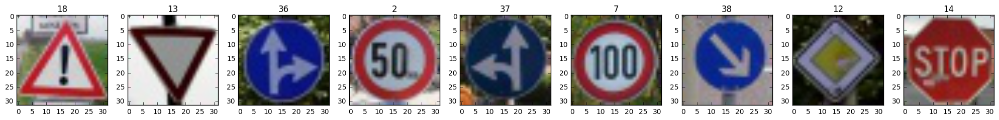

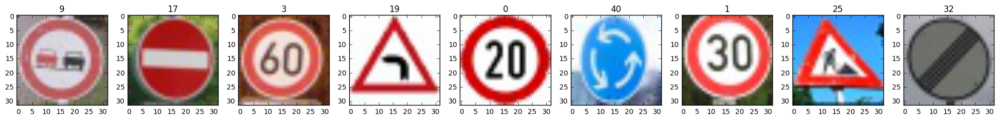

18
0 : Actual = 18 ,Predicted= 18 , softmax probability = 1.0
1 : Actual = 13 ,Predicted= 13 , softmax probability = 1.0
2 : Actual = 36 ,Predicted= 36 , softmax probability = 1.0
3 : Actual = 2 ,Predicted= 2 , softmax probability = 1.0
4 : Actual = 37 ,Predicted= 37 , softmax probability = 1.0
5 : Actual = 7 ,Predicted= 1 , softmax probability = 1.0
6 : Actual = 38 ,Predicted= 38 , softmax probability = 1.0
7 : Actual = 12 ,Predicted= 12 , softmax probability = 1.0
8 : Actual = 14 ,Predicted= 14 , softmax probability = 1.0
9 : Actual = 9 ,Predicted= 9 , softmax probability = 1.0
10 : Actual = 17 ,Predicted= 17 , softmax probability = 1.0
11 : Actual = 3 ,Predicted= 3 , softmax probability = 1.0
12 : Actual = 19 ,Predicted= 19 , softmax probability = 1.0
13 : Actual = 0 ,Predicted= 0 , softmax probability = 1.0
14 : Actual = 40 ,Predicted= 40 , softmax probability = 1.0
15 : Actual = 1 ,Predicted= 20 , softmax probability = 1.0
16 : Actual = 25 ,Predicted= 25 , softmax probability = 1.

In [21]:
batch_size = 9
for start in range(0, len(images), batch_size): 
    end = start+batch_size 
    end = end if end < len(images) else len(images)
    batch_size = end - start
    fig, axes = plt.subplots(1,batch_size)
    end = start+mini_batch_size
    for i, ((image, ax), label) in enumerate(zip(zip(images[start:end], axes), data_labels[start:end])):
        ax.set_title(label)
        ax.imshow(image.squeeze())

    plt.tight_layout()
    plt.subplots_adjust(top=0.85)
    plt.show()

count = 0
print(len(probs))
for image_prob in range(len(probs)):
    probabilities = probs[image_prob]
   
    for i in range(len(probabilities)):
        if probabilities[i] > 0.5:
            print(image_prob, ':', 'Actual =', data_labels[image_prob], ',Predicted=', i, ',',  'softmax probability =', probabilities[i])
            if int(data_labels[image_prob]) != int(i):
                count += 1

print('Count of bad predictions', count)

### Question 8

*Use the model's softmax probabilities to visualize the **certainty** of its predictions, [`tf.nn.top_k`](https://www.tensorflow.org/versions/r0.12/api_docs/python/nn.html#top_k) could prove helpful here. Which predictions is the model certain of? Uncertain? If the model was incorrect in its initial prediction, does the correct prediction appear in the top k? (k should be 5 at most)*

`tf.nn.top_k` will return the values and indices (class ids) of the top k predictions. So if k=3, for each sign, it'll return the 3 largest probabilities (out of a possible 43) and the correspoding class ids.

Take this numpy array as an example:

```
# (5, 6) array
a = np.array([[ 0.24879643,  0.07032244,  0.12641572,  0.34763842,  0.07893497,
         0.12789202],
       [ 0.28086119,  0.27569815,  0.08594638,  0.0178669 ,  0.18063401,
         0.15899337],
       [ 0.26076848,  0.23664738,  0.08020603,  0.07001922,  0.1134371 ,
         0.23892179],
       [ 0.11943333,  0.29198961,  0.02605103,  0.26234032,  0.1351348 ,
         0.16505091],
       [ 0.09561176,  0.34396535,  0.0643941 ,  0.16240774,  0.24206137,
         0.09155967]])
```

Running it through `sess.run(tf.nn.top_k(tf.constant(a), k=3))` produces:

```
TopKV2(values=array([[ 0.34763842,  0.24879643,  0.12789202],
       [ 0.28086119,  0.27569815,  0.18063401],
       [ 0.26076848,  0.23892179,  0.23664738],
       [ 0.29198961,  0.26234032,  0.16505091],
       [ 0.34396535,  0.24206137,  0.16240774]]), indices=array([[3, 0, 5],
       [0, 1, 4],
       [0, 5, 1],
       [1, 3, 5],
       [1, 4, 3]], dtype=int32))
```

Looking just at the first row we get `[ 0.34763842,  0.24879643,  0.12789202]`, you can confirm these are the 3 largest probabilities in `a`. You'll also notice `[3, 0, 5]` are the corresponding indices.

In [22]:
k=3
values, indices = tf.nn.top_k(probs, k)
print('values: ', values,',', 'indices: ',indices)


values:  Tensor("TopKV2:0", shape=(18, 3), dtype=float32) , indices:  Tensor("TopKV2:1", shape=(18, 3), dtype=int32)


In [23]:
with tf.Session() as sess:
    values, indices =sess.run(tf.nn.top_k(tf.constant(probs), k=3))
    print('values: ', values,',', 'indices: ',indices)

values:  [[ 1.  0.  0.]
 [ 1.  0.  0.]
 [ 1.  0.  0.]
 [ 1.  0.  0.]
 [ 1.  0.  0.]
 [ 1.  0.  0.]
 [ 1.  0.  0.]
 [ 1.  0.  0.]
 [ 1.  0.  0.]
 [ 1.  0.  0.]
 [ 1.  0.  0.]
 [ 1.  0.  0.]
 [ 1.  0.  0.]
 [ 1.  0.  0.]
 [ 1.  0.  0.]
 [ 1.  0.  0.]
 [ 1.  0.  0.]
 [ 1.  0.  0.]] , indices:  [[18  0  1]
 [13  0  1]
 [36  0  1]
 [ 2  0  1]
 [37  0  1]
 [ 1  0  2]
 [38  0  1]
 [12  0  1]
 [14  0  1]
 [ 9  0  1]
 [17  0  1]
 [ 3  0  1]
 [19  0  1]
 [ 0  1  2]
 [40  0  1]
 [20  0  1]
 [25  0  1]
 [32  0  1]]


**Answer:**
[18  0  1] are the indices corresponding to larger probabilities.

> **Note**: Once you have completed all of the code implementations and successfully answered each question above, you may finalize your work by exporting the iPython Notebook as an HTML document. You can do this by using the menu above and navigating to  \n",
    "**File -> Download as -> HTML (.html)**. Include the finished document along with this notebook as your submission.